In [158]:
import openseespywin as ops
import opsvis as opsv 
import numpy as np
import ipywidgets as widgets
import os
import matplotlib.pyplot as plt
import math
import opstool as opst
#import eurocodepy as ecpy
import time as tt
import gmsh
# import openseespy.postprocessing.Get_Rendering as opsplt

In [159]:
import sys
sys.path.append('Data')
import functions.solver_function as SF
import importlib
importlib.reload(SF)
from functions.solver_function import *

In [160]:
opst.add_ops_hints_file()

OPSTOOL :: opensees.pyi file has been created to 
C:\Users\micha\miniconda3\envs\blue_env\Lib\site-packages\openseespywin\opensees.pyi!

In [161]:
length_unit = "m"  # base unit
force_unit = "KN"  # base unit

UNIT = opst.pre.UnitSystem(length=length_unit, force=force_unit)

print("Length:", UNIT.mm, UNIT.mm2, UNIT.cm, UNIT.m,)
print("Force", UNIT.N, UNIT.kN, )
print("Stress", UNIT.MPa, UNIT.kPa, UNIT.Pa, )
print("Mass", UNIT.g, UNIT.kg, UNIT.ton)
print(UNIT)

Length: 0.001 1e-06 0.01 1
Force 0.001 1
Stress 1000.0 1.0 0.001
Mass 1e-06 0.001 1.0
<UnitSystem: length='m', force='kn', time='sec' (128180300186)>


In [162]:
lc = 0.3

# Initialize Gmsh
import gmsh
import sys

gmsh.initialize()
gmsh.model.add("fused_shapes")
occ = gmsh.model.occ

# --- Rectangles ---
rect1 = occ.addRectangle(0, 0, 0, 15, 4)

occ.synchronize()
gmsh.option.setNumber("Mesh.RecombineAll", 1)

# --- Triangle beside rect2 ---
p1 = occ.addPoint(5, 4, 0)
p2 = occ.addPoint(15, 4, 0)
p3 = occ.addPoint(15, 8, 0)
p4 = occ.addPoint(12, 8, 0)
l5 = occ.addLine(p1, p2)
l6 = occ.addLine(p2, p3)
l7 = occ.addLine(p3, p4)
l8 = occ.addLine(p4, p1)
triangle_loop = occ.addCurveLoop([l5, l6, l7, l8])
triangle = occ.addPlaneSurface([triangle_loop])

occ.synchronize()
gmsh.option.setNumber("Mesh.RecombineAll", 1)

# --- Fragment everything ---
fused = occ.fragment([(2, rect1)], [(2, triangle)])

# --- Synchronize ---
occ.synchronize()

# --- Line Physical Groups ---
gmsh.model.addPhysicalGroup(1, [1], tag=201)
gmsh.model.setPhysicalName(1, 201, "bottom_support")

gmsh.model.addPhysicalGroup(1, [2], tag=202)
gmsh.model.setPhysicalName(1, 202, "right_bot_support")

gmsh.model.addPhysicalGroup(1, [6], tag=203)
gmsh.model.setPhysicalName(1, 203, "right_top_support")

gmsh.model.addPhysicalGroup(1, [5], tag=204)
gmsh.model.setPhysicalName(1, 204, "left_support")

gmsh.model.addPhysicalGroup(1, [l7], tag=205)
gmsh.model.setPhysicalName(1, 205, "loadings")

gmsh.model.addPhysicalGroup(2, [1], 301)
gmsh.model.setPhysicalName(2, 301, "soil_bot")

gmsh.model.addPhysicalGroup(2, [2], 302)
gmsh.model.setPhysicalName(2, 302, "soil_top")

# --- Synchronize ---
occ.synchronize()

# --- Points to embed ---
embed_coords = [
    (11.2520, 6.2098, 0),
    (10.1450, 5.2189, 0),
    (8.6716, 4.1979, 0),
    (11.5000, 6.5000, 0),
    (11.0000, 5.5000, 0),
    (10.0000, 5.0000, 0),
    (9.0000, 3.5000, 0),
    (7.0000, 3.5000, 0),
    (6.0000, 3.0000, 0),
    (5.5000, 3.0000, 0),
    (5.0000, 2.5000, 0),
]

embed_pts_occ = [occ.addPoint(x, y, z, lc) for x, y, z in embed_coords]

# --- Synchronize ---
occ.synchronize()

# --- Embed points in triangle ---
# Helper to match 3D coordinates approximately
def coords_close(c1, c2, tol=1e-4):
    return all(isclose(a, b, abs_tol=tol) for a, b in zip(c1, c2))

# Get all 2D surfaces
surfaces = gmsh.model.getEntities(2)

# Build mapping of surface tag to bounding box
surface_boxes = {}
for dim, tag in surfaces:
    box = gmsh.model.getBoundingBox(dim, tag)
    surface_boxes[tag] = box

# Embed points into correct surface
for pt in embed_pts_occ:
    coord = gmsh.model.getValue(0, pt, [])
    x, y, z = coord

    for surf_tag, (xmin, ymin, zmin, xmax, ymax, zmax) in surface_boxes.items():
        if xmin <= x <= xmax and ymin <= y <= ymax:
            gmsh.model.mesh.embed(0, [pt], 2, surf_tag)
            print(f"Embedded point ({x:.3f}, {y:.3f}) to surface {surf_tag}")
            break

# --- Local refinement using Ball fields ---
ball_fields = []
for x, y, z in embed_coords:
    fid = gmsh.model.mesh.field.add("Ball")
    gmsh.model.mesh.field.setNumber(fid, "XCenter", x)
    gmsh.model.mesh.field.setNumber(fid, "YCenter", y)
    gmsh.model.mesh.field.setNumber(fid, "ZCenter", z)
    gmsh.model.mesh.field.setNumber(fid, "Radius", 1.0)
    gmsh.model.mesh.field.setNumber(fid, "VIn", 0.1)
    gmsh.model.mesh.field.setNumber(fid, "VOut", 0.4)
    ball_fields.append(fid)

# Combine Ball fields
min_field = gmsh.model.mesh.field.add("Min")
gmsh.model.mesh.field.setNumbers(min_field, "FieldsList", ball_fields)
gmsh.model.mesh.field.setAsBackgroundMesh(min_field)

# ----- Point embedding here -----


# --- Mesh settings ---
gmsh.model.mesh.setSize(gmsh.model.getEntities(0), 0.5)
# --- Generate mesh ---
gmsh.model.mesh.generate(2)
gmsh.write("slope_da.msh")
#gmsh.fltk.run()
#gmsh.finalize()

Embedded point (11.252, 6.210) to surface 2
Embedded point (10.145, 5.219) to surface 2
Embedded point (8.672, 4.198) to surface 2
Embedded point (11.500, 6.500) to surface 2
Embedded point (11.000, 5.500) to surface 2
Embedded point (10.000, 5.000) to surface 2
Embedded point (9.000, 3.500) to surface 1
Embedded point (7.000, 3.500) to surface 1
Embedded point (6.000, 3.000) to surface 1
Embedded point (5.500, 3.000) to surface 1
Embedded point (5.000, 2.500) to surface 1


In [163]:
# Initialize GMSH to OpenSeesPy converter with 3D model and 3 degrees of freedom per node
GMSH2OPS = opst.pre.Gmsh2OPS(ndm=2, ndf=2)
# Read the saved .msh file generated by GMSH
GMSH2OPS.read_gmsh_file("slope_da.msh")
#GMSH2OPS.read_gmsh_data()
# Finalize and close, must after GMSH2OPS.read_gmsh_data()
gmsh.finalize()  # !!!!!!!!!!!!!!!

Info:: 7 Physical Names.
Info:: 2721 Nodes; MaxNodeTag 2721; MinNodeTag 1.
Info:: 2740 Elements; MaxEleTag 2740; MinEleTag 1.
Info:: Geometry Information >>>
28 Entities: 18 Point; 8 Curves; 2 Surfaces; 0 Volumes.

Info:: Physical Groups Information >>>
7 Physical Groups.
Physical Group names: ['bottom_support', 'right_bot_support', 'left_support', 'right_top_support', 'loadings', 'soil_bot', 'soil_top']

Info:: Mesh Information >>>
2721 Nodes; MaxNodeTag 2721; MinNodeTag 1.
2740 Elements; MaxEleTag 2740; MinEleTag 1.



In [164]:

# Physical constants
accMul = 9.81
massDen = 2.000*UNIT.ton / UNIT.m3      # solid mass density (ton/m3)
fluidDen = 1.0*UNIT.ton / UNIT.m3        # fluid mass density (ton/m3)
massProportionalDamping = 0.0
stiffnessProportionalDamping = 0.001
cohesion = 30
peakShearStrain = 0.1
E1 = 90000.0          # Young's modulus (kPa)
poisson1 = 0.40

# Derived parameters
G = E1 / (2 * (1 + poisson1))                     # Shear modulus
B = E1 / (3 * (1 - 2 * poisson1))                 # Bulk modulus

press = 0                                         # isotropic consolidation pressure
rho_d = 0
period = 1                                        # period of sinusoidal loading
deltaT = 0.01                                     # time step
numSteps = 2000                                   # total steps
gamma = 0.5                                       # Newmark parameter
pi = math.pi
inclination = 0                                   # degrees

# Buoyant unit weight components
unitWeightX = (massDen - fluidDen) * accMul * math.sin(math.radians(inclination))
unitWeightY = -(massDen - fluidDen) * accMul * math.cos(math.radians(inclination))



soil_thickness = 1000*UNIT.mm
etype = "PlaneStrain"


# Fixity definitions
fixXY = [1, 1]
fixXonly = [1, 0]
fixYonly = [0, 1]

ops.wipe()
# Initialize a basic 3D model with 3 degrees of freedom per node
ops.model("basic", "-ndm", 2, "-ndf", 2)

ops.nDMaterial(
        "PressureIndependMultiYield",
        5, #tag
        2, # number of dimension
        2.0*UNIT.ton / UNIT.m3, #rho ton /m3
        1.5e5, # ref shear modulus kpa
        7.5e5, #ref bulk modulus kPa
        60, # cohesi (c)
        0.1, # peakShearStra (γmax)
        33, # frictionAng
        100, # refPress
        0.0, # pressDependCoe
        )


soil_mat_tag = 1
ops.nDMaterial("InitialStateAnalysisWrapper", soil_mat_tag, 5, 2)

contact_mat = 2
ops.nDMaterial("ContactMaterial2D", contact_mat, 0.1, 1000.0, 0.0, 0.0) #kN/m


In [165]:
GMSH2OPS.create_node_cmds()

soil_groups = [
    "soil_bot",
    "soil_top"
]

element_args = [soil_mat_tag, etype, soil_thickness] # press, rho_d, unitWeightX, unitWeightY

# Create elements for each soil group
for group_name in soil_groups:
    ele_tags = GMSH2OPS.create_element_cmds(
        ops_ele_type="SSPquad",
        ops_ele_args=element_args,
        physical_group_names=[group_name]
    )


In [166]:
GMSH2OPS.create_fix_cmds(
    physical_group_names=["left_support"], dofs=[*fixXonly]
)

[133, 134, 135, 136, 137, 138, 139, 140, 141]

In [167]:
GMSH2OPS.create_fix_cmds(
    physical_group_names=["right_top_support"], dofs=[*fixXonly]
)

[142, 143, 144, 145, 146, 147, 148, 149, 150]

In [168]:
GMSH2OPS.create_fix_cmds(
    physical_group_names=["right_bot_support"], dofs=[*fixXonly]
)

[56, 57, 58, 59, 60, 61, 62, 63, 64]

In [169]:
GMSH2OPS.create_fix_cmds(
    physical_group_names=["bottom_support"], dofs=[*fixYonly]
)

[19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55]

In [170]:
ops.fix(1, 1, 1)
ops.fix(2, 1, 1)
ops.fix(3, 1, 0)
ops.fix(5, 1, 0)
ops.fix(6, 1, 0)

In [171]:
opst.vis.plotly.plot_model(show_node_numbering=False, show_ele_numbering=False, show_nodal_loads = False)

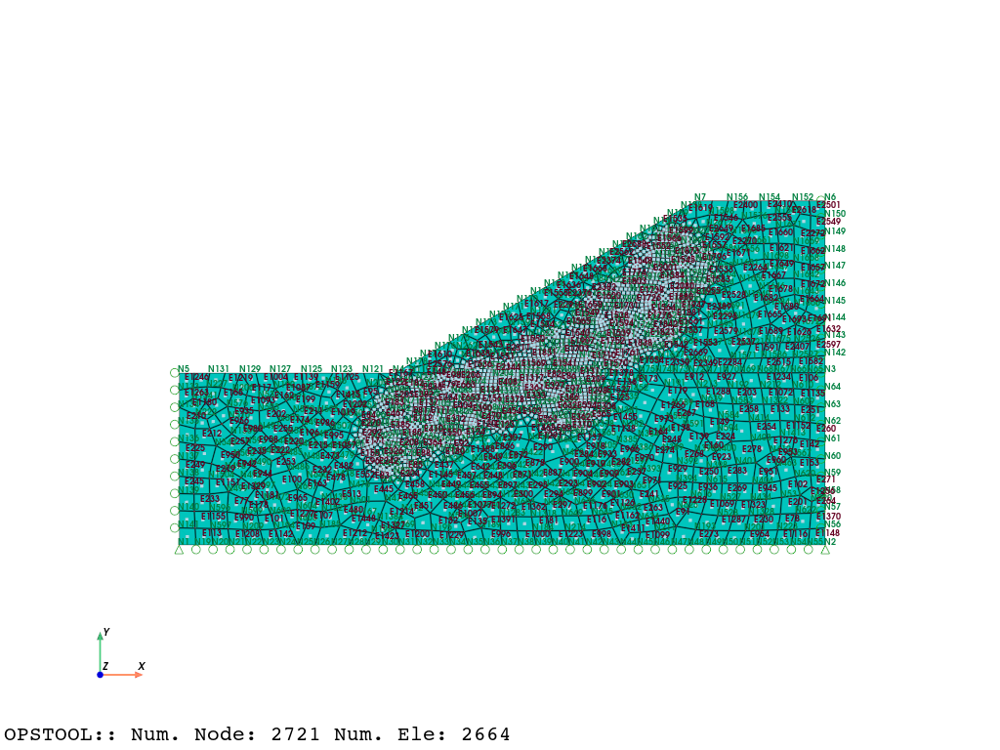

In [172]:
OPSVIS = opst.vis.pyvista
OPSVIS.set_plot_props(point_size=1, font_size=9, notebook=True)
OPSVIS.plot_model(show_node_numbering=True, show_ele_numbering=True).show(jupyter_backend="jupyterlab")

In [173]:
node_mass = opst.pre.get_node_mass()  # get the node mass dict

In [174]:
print("Node Masses:")
for node, mass in node_mass.items():
    print(f"Node {node}: {mass}")

Node Masses:
Node 1: [0.07719368890117492, 0.07719368890117492]
Node 2: [0.0754992165505948, 0.0754992165505948]
Node 3: [0.15076422032998948, 0.15076422032998948]
Node 4: [0.07311980292878736, 0.07311980292878736]
Node 5: [0.06640078178127508, 0.06640078178127508]
Node 6: [0.06945427245084032, 0.06945427245084032]
Node 7: [0.1222460379050367, 0.1222460379050367]
Node 8: [0.010799896438052809, 0.010799896438052809]
Node 9: [0.010378027621118308, 0.010378027621118308]
Node 10: [0.027819482795799818, 0.027819482795799818]
Node 11: [0.01780575512787326, 0.01780575512787326]
Node 12: [0.01828567314201101, 0.01828567314201101]
Node 13: [0.019142207522475512, 0.019142207522475512]
Node 14: [0.016865290571690103, 0.016865290571690103]
Node 15: [0.017882173578778235, 0.017882173578778235]
Node 16: [0.01363992527021153, 0.01363992527021153]
Node 17: [0.019717325091773645, 0.019717325091773645]
Node 18: [0.01371552849567165, 0.01371552849567165]
Node 19: [0.15274671954046248, 0.15274671954046248

In [175]:
ops.timeSeries("Constant", 1)  # Define a constant time series
ops.pattern("Plain", 1, 1)  # Define a load pattern
node_loads = opst.pre.create_gravity_load(direction="Y", factor=-9.81)  # Create gravity loads in the pattern 1

In [176]:
# create the SOE, ConstraintHandler, Integrator, Algorithm and Numberer
ops.updateMaterialStage("-material", 1, "-stage", 0)
ops.numberer("RCM")
ops.system("ProfileSPD")
ops.test("NormDispIncr", 1e-08, 30, 0)
ops.algorithm("KrylovNewton")
ops.constraints("Penalty", 1e18, 1e18)
ops.integrator("Newmark", 1.5, 1.0)
ops.analysis("Transient")
ops.analyze(10, 5000.0)
ops.updateMaterialStage("-material", 1, "-stage", 1)
ops.analyze(100, 1.0)

0

In [177]:
ops.wipeAnalysis()
ops.setTime(0.0)
ops.timeSeries("Trig", 2, 0.0, 10.0, 1.0, "-factor", 2)
ops.pattern("UniformExcitation", 2, 2, "-accel", 2)

In [178]:
ops.constraints("Penalty", 1e18, 1e18)
ops.test("NormDispIncr", 0.0001, 25, 0)
ops.numberer("RCM")
ops.algorithm("KrylovNewton")
ops.system("ProfileSPD")
ops.integrator("Newmark", 0.6, 0.30250000000000005)
ops.rayleigh(0.0, 0.0, 0.002, 0.0)
ops.analysis("Transient")

In [179]:
opst.vis.plotly.plot_model(show_node_numbering=True, show_ele_numbering=False, show_nodal_loads = True)

In [180]:
ODB = opst.post.CreateODB(
    odb_tag=1,
    compute_mechanical_measures=True,
    project_gauss_to_nodes="copy",  # "extrapolate", "copy", "average"
)
for _ in range(1000):
    ops.analyze(1, 1)
    ODB.fetch_response_step()
ODB.save_response(zlib=True)

OPSTOOL ::  All responses data with _odb_tag = 1 saved in .opstool.output/RespStepData-1.nc!

In [181]:
import matplotlib.pyplot as plt
import opstool as opst
import opstool.vis.pyvista as opsvis

OPSTOOL ::  Loading response data from .opstool.output/RespStepData-1.nc ...

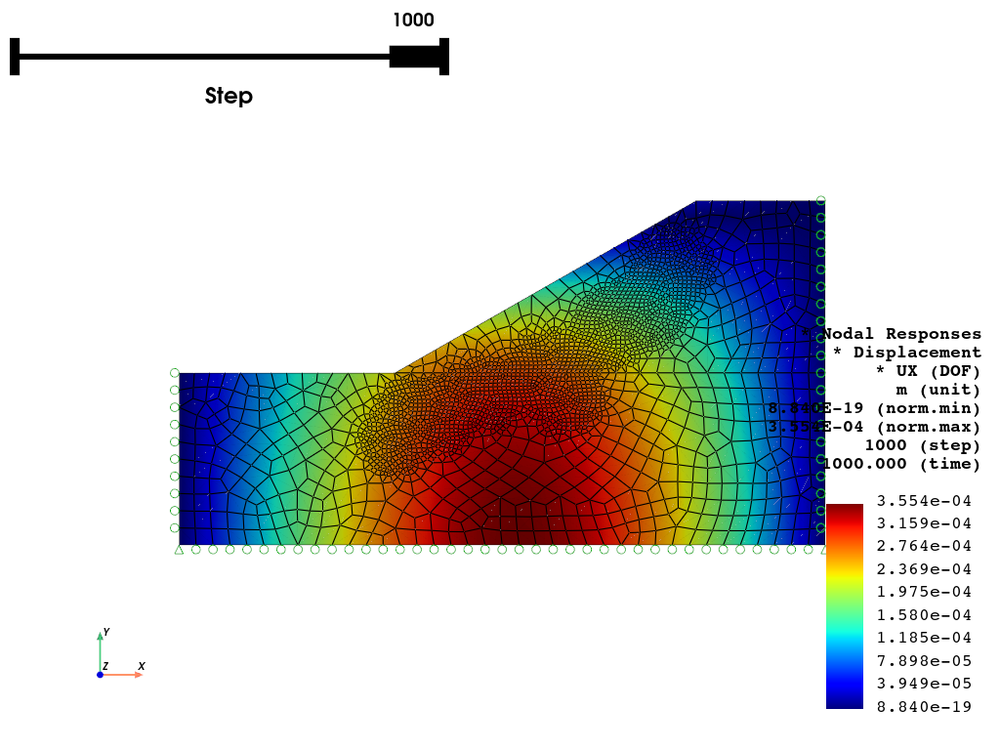

In [182]:
opsvis.plot_nodal_responses(
    odb_tag=1,
    slides=True,
    scale=0.0001,
    resp_type="disp",
    resp_dof=["UX"],
    unit_symbol="m",
).show(jupyter_backend="jupyterlab")

In [183]:
77

77

OPSTOOL ::  Loading response data from .opstool.output/RespStepData-1.nc ...

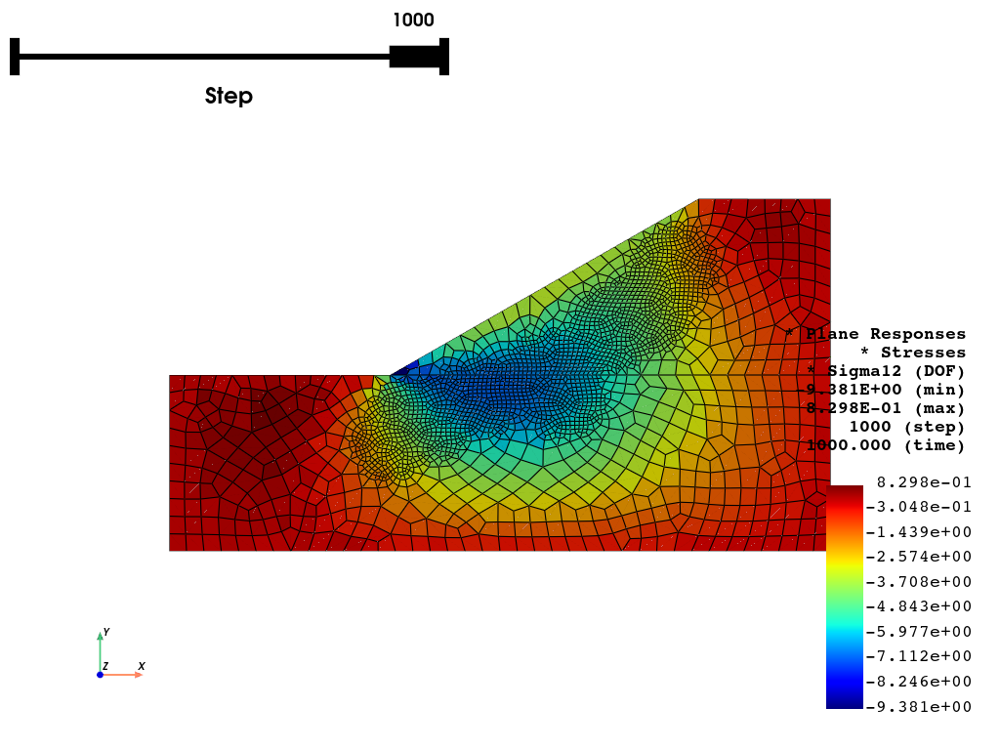

In [184]:
opsvis.plot_unstruct_responses(
    odb_tag=1, slides=True, ele_type="Plane", resp_type="Stresses", resp_dof="sigma12",bc_scale = 0.001,show_defo = True, defo_scale = 1
).show(jupyter_backend="jupyterlab")

In [185]:
ele_resp = opst.post.get_element_responses(odb_tag=1, ele_type="Plane")

OPSTOOL ::  Loading Plane response data from .opstool.output/RespStepData-1.nc ...

In [186]:
print("Data Variables in Element Responses:", ele_resp.data_vars)

Data Variables in Element Responses: Data variables:
    Stresses               (time, eleTags, GaussPoints, stressDOFs) float32 53MB ...
    Strains                (time, eleTags, GaussPoints, strainDOFs) float32 32MB ...
    StressesAtNodes        (time, nodeTags, stressDOFs) float32 54MB 0.0 ... 0.0
    StrainsAtNodes         (time, nodeTags, strainDOFs) float32 33MB 0.0 ... 0.0
    StressAtNodesErr       (time, nodeTags, stressDOFs) float32 54MB 0.0 ... 0.0
    StrainsAtNodesErr      (time, nodeTags, strainDOFs) float32 33MB 0.0 ... 0.0
    StressMeasures         (time, eleTags, GaussPoints, measures) float32 43MB ...
    StrainMeasures         (time, eleTags, GaussPoints, measures) float32 43MB ...
    StressMeasuresAtNodes  (time, nodeTags, measures) float32 44MB 0.0 ... 0.0
    StrainMeasuresAtNodes  (time, nodeTags, measures) float32 44MB 0.0 ... 0.0


In [187]:
sigma11 = ele_resp["Stresses"].sel(stressDOFs="sigma11", eleTags=449)
sigma22 = ele_resp["Stresses"].sel(stressDOFs="sigma22", eleTags=449)
sigma12 = ele_resp["Stresses"].sel(stressDOFs="sigma12", eleTags=449)
#eta_r = ele_resp["Stresses"].sel(stressDOFs="eta_r", eleTags=449)

In [188]:
po = (sigma11 + sigma22) / 2.0
qo = (sigma11 - sigma22) ** 2 + 6 * (sigma12**2)
qo = np.sign(sigma12) * 1 / 3 * np.sqrt(qo)
print(qo)

<xarray.DataArray 'Stresses' (time: 1001, GaussPoints: 1)> Size: 4kB
array([[-3.3841932],
       [-3.3841932],
       [-3.3841932],
       ...,
       [-3.3841932],
       [-3.3841932],
       [-3.3841932]], shape=(1001, 1), dtype=float32)
Coordinates:
  * time         (time) float32 4kB 0.0 1.0 2.0 3.0 ... 997.0 998.0 999.0 1e+03
    eleTags      int64 8B 449
  * GaussPoints  (GaussPoints) int64 8B 1
    stressDOFs   <U7 28B 'sigma12'


In [189]:
eps11 = ele_resp["Strains"].sel(strainDOFs="eps11", eleTags=449)
eps22 = ele_resp["Strains"].sel(strainDOFs="eps22", eleTags=449)
eps12 = ele_resp["Strains"].sel(strainDOFs="eps12", eleTags=449)

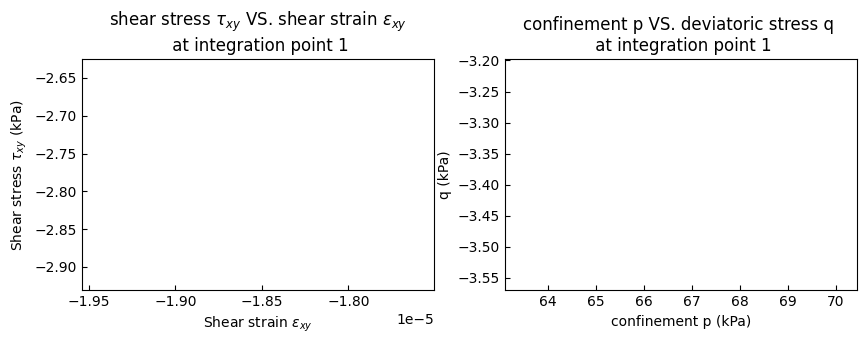

In [190]:
eps12_ele1_1 = eps12.sel(GaussPoints=1)
sigma12_ele1_1 = sigma12.sel(GaussPoints=1)
po_ele1_1 = po.sel(GaussPoints=1)
qo_ele1_1 = qo.sel(GaussPoints=1)

fig, axs = plt.subplots(1, 2, figsize=(10, 3))
axs[0].plot(eps12_ele1_1, sigma12_ele1_1, "b")
axs[0].set_title("shear stress $\\tau_{xy}$ VS. shear strain $\\epsilon_{xy}$ \n at integration point 1")
axs[0].set_xlabel(r"Shear strain $\epsilon_{xy}$")
axs[0].set_ylabel(r"Shear stress $\tau_{xy}$ (kPa)")
axs[1].plot(-po_ele1_1, qo_ele1_1, "r")
axs[1].set_title("confinement p VS. deviatoric stress q \n at integration point 1")
axs[1].set_xlabel("confinement p (kPa)")
axs[1].set_ylabel("q (kPa)")
plt.show()